<a href="https://colab.research.google.com/github/DemerchyanAlbert/reinforcement-learning/blob/main/Demerchyan(Breakout_DQN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install gymnasium[atari,accept-rom-license]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 958.1/958.1 kB 52.8 MB/s eta 0:00:00


In [ ]:
!pip install gymnasium[atari] torch torchvision numpy

In [ ]:
!pip install ale-py

In [ ]:
import gymnasium as gym
import ale_py
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
from collections import deque
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
env = gym.make("ALE/Breakout-v5", render_mode='rgb_array')

Using device: cuda


In [ ]:
class DQNetwork(nn.Module):
    def __init__(self, input_shape, num_actions):
        super(DQNetwork, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(input_shape[0], 32, kernel_size=8, stride=4),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=3, stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(64),
        )

        conv_out_size = self._get_conv_out(input_shape)

        self.fc = nn.Sequential(
            nn.Linear(conv_out_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_actions)
        )

    def _get_conv_out(self, shape):
        o = self.conv(torch.zeros(1, *shape))
        return int(torch.prod(torch.tensor(o.size())))

    def forward(self, x):
        conv_out = self.conv(x).view(x.size()[0], -1)
        return self.fc(conv_out)

In [ ]:
class ReplayBuffer:
    def __init__(self, capacity, num_frames=4):
        self.buffer = deque(maxlen=capacity)
        self.num_frames = num_frames

    def push(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        state, action, reward, next_state, done = zip(*random.sample(self.buffer, batch_size))
        return np.stack(state), action, reward, np.stack(next_state), done

    def get_recent_frames(self):
        frames = [experience[0] for experience in list(self.buffer)[-self.num_frames:]]
        return np.stack(frames, axis=0)

    def __len__(self):
        return len(self.buffer)

In [ ]:
class DQNAgent:
    def __init__(self, env, buffer_size, batch_size, gamma, lr, epsilon_start, epsilon_end, epsilon_decay, num_frames=4):
        self.env = env
        self.buffer = ReplayBuffer(buffer_size, num_frames)
        self.batch_size = batch_size
        self.gamma = gamma
        self.epsilon = epsilon_start
        self.epsilon_end = epsilon_end
        self.epsilon_decay = epsilon_decay
        self.num_frames = num_frames  # Количество кадров для одного состояния

        self.state_shape = (self.num_frames, 84, 84)
        self.num_actions = env.action_space.n

        self.q_network = DQNetwork(self.state_shape, self.num_actions).to(device)  # Используем DQNetwork
        self.target_network = DQNetwork(self.state_shape, self.num_actions).to(device)

        self.optimizer = optim.Adam(self.q_network.parameters(), lr=lr)
        self.update_target_network()

    def update_target_network(self):
        self.target_network.load_state_dict(self.q_network.state_dict())

    def act(self, state, epsilon=0.0):
        if random.random() > epsilon:
            state = torch.tensor(state, dtype=torch.float32).unsqueeze(0).to(device)
            q_values = self.q_network(state)
            action = torch.argmax(q_values, dim=1).item()
        else:
            action = self.env.action_space.sample()
        return action

    def update(self):
        if len(self.buffer) < self.batch_size:
            return

        states, actions, rewards, next_states, dones = self.buffer.sample(self.batch_size)

        states = torch.tensor(states, dtype=torch.float32).to(device)
        actions = torch.tensor(actions, dtype=torch.int64).unsqueeze(1).to(device)
        rewards = torch.tensor(rewards, dtype=torch.float32).to(device)
        next_states = torch.tensor(next_states, dtype=torch.float32).to(device)
        dones = torch.tensor(dones, dtype=torch.float32).to(device)

        q_values = self.q_network(states).gather(1, actions).squeeze(1)
        next_q_values = self.target_network(next_states).max(1)[0]
        target_q_values = rewards + self.gamma * next_q_values * (1 - dones)

        loss = nn.functional.mse_loss(q_values, target_q_values.detach())

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def push(self, state, action, reward, next_state, done):
        self.buffer.push(state, action, reward, next_state, done)

    def decay_epsilon(self):
        self.epsilon = max(self.epsilon_end, self.epsilon * self.epsilon_decay)

In [ ]:
buffer_size = 100000
batch_size = 64
gamma = 0.99
lr = 0.00025
epsilon_start = 1.0
epsilon_end = 0.01
epsilon_decay = 0.995

# Инициализация агента DQN
agent = DQNAgent(
    env,
    buffer_size,
    batch_size,
    gamma,
    lr,
    epsilon_start,
    epsilon_end,
    epsilon_decay
)

In [ ]:
def save_weights(agent, path='dqn_breakout.pth'):
    torch.save(agent.q_network.state_dict(), path)
    print("Model weights saved!")

def load_weights(agent, path='dqn_breakout.pth'):
    agent.q_network.load_state_dict(torch.load(path))
    agent.q_network.eval()
    print("Model weights loaded!")

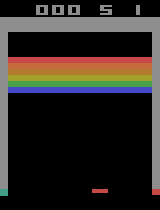

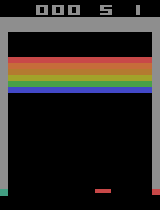

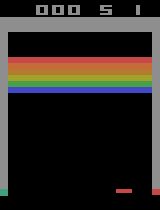

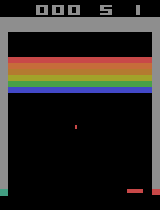

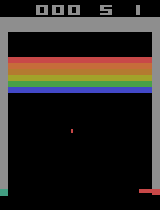

...

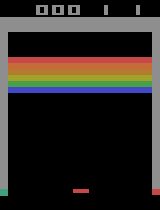

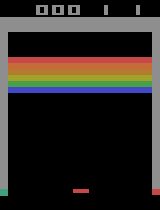

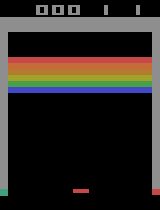

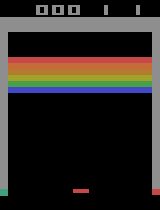

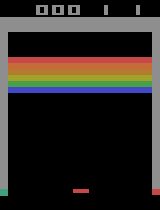

End of Episode 0: Total Reward: 0.0
Episode 0, Reward: 0.0, Epsilon: 0.995
End of Episode 1: Total Reward: 3.0
End of Episode 2: Total Reward: 1.0
End of Episode 3: Total Reward: 3.0
End of Episode 4: Total Reward: 0.0
End of Episode 5: Total Reward: 0.0
End of Episode 6: Total Reward: 4.0
End of Episode 7: Total Reward: 0.0
End of Episode 8: Total Reward: 2.0
End of Episode 9: Total Reward: 2.0
End of Episode 10: Total Reward: 3.0
End of Episode 11: Total Reward: 1.0
End of Episode 12: Total Reward: 2.0
End of Episode 13: Total Reward: 1.0
End of Episode 14: Total Reward: 2.0
End of Episode 15: Total Reward: 1.0
End of Episode 16: Total Reward: 1.0
End of Episode 17: Total Reward: 1.0
End of Episode 18: Total Reward: 3.0
End of Episode 19: Total Reward: 1.0
End of Episode 20: Total Reward: 3.0
End of Episode 21: Total Reward: 1.0
End of Episode 22: Total Reward: 0.0
End of Episode 23: Total Reward: 1.0
End of Episode 24: Total Reward: 1.0
End of Episode 25: Total Reward: 1.0
End of Ep

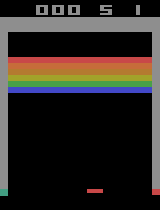

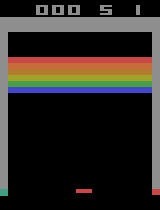

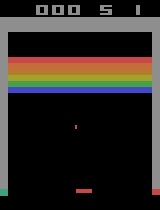

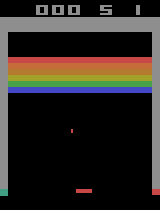

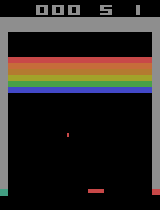

...

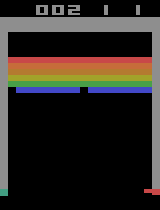

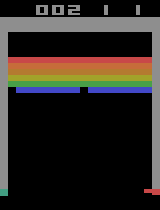

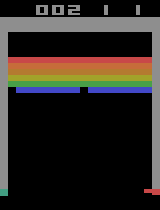

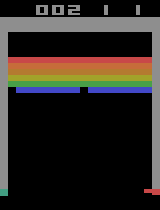

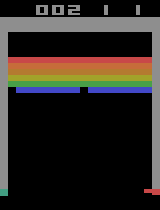

End of Episode 100: Total Reward: 2.0
Episode 100, Reward: 2.0, Epsilon: 0.6027415843082742
End of Episode 101: Total Reward: 2.0
End of Episode 102: Total Reward: 0.0
End of Episode 103: Total Reward: 0.0
End of Episode 104: Total Reward: 0.0
End of Episode 105: Total Reward: 0.0
End of Episode 106: Total Reward: 2.0
End of Episode 107: Total Reward: 0.0
End of Episode 108: Total Reward: 3.0
End of Episode 109: Total Reward: 1.0
End of Episode 110: Total Reward: 1.0
End of Episode 111: Total Reward: 0.0
End of Episode 112: Total Reward: 5.0
End of Episode 113: Total Reward: 3.0
End of Episode 114: Total Reward: 1.0
End of Episode 115: Total Reward: 0.0
End of Episode 116: Total Reward: 0.0
End of Episode 117: Total Reward: 0.0
End of Episode 118: Total Reward: 4.0
End of Episode 119: Total Reward: 1.0
End of Episode 120: Total Reward: 0.0
End of Episode 121: Total Reward: 2.0
End of Episode 122: Total Reward: 5.0
End of Episode 123: Total Reward: 2.0
End of Episode 124: Total Reward: 

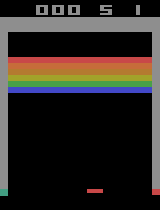

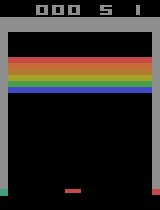

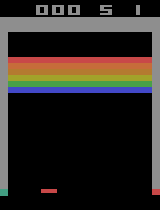

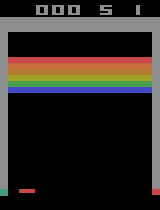

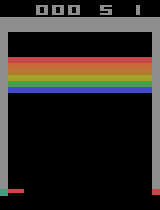

...

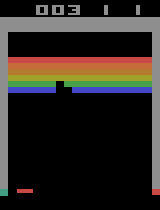

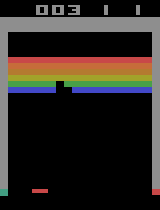

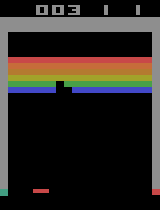

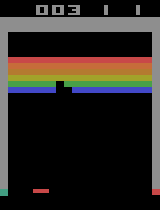

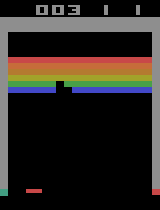

End of Episode 200: Total Reward: 3.0
Episode 200, Reward: 3.0, Epsilon: 0.36512303261753626
End of Episode 201: Total Reward: 3.0
End of Episode 202: Total Reward: 3.0
End of Episode 203: Total Reward: 3.0
End of Episode 204: Total Reward: 1.0
End of Episode 205: Total Reward: 1.0
End of Episode 206: Total Reward: 2.0
End of Episode 207: Total Reward: 0.0
End of Episode 208: Total Reward: 3.0
End of Episode 209: Total Reward: 0.0
End of Episode 210: Total Reward: 2.0
End of Episode 211: Total Reward: 2.0
End of Episode 212: Total Reward: 3.0
End of Episode 213: Total Reward: 1.0
End of Episode 214: Total Reward: 2.0
End of Episode 215: Total Reward: 2.0
End of Episode 216: Total Reward: 1.0
End of Episode 217: Total Reward: 0.0
End of Episode 218: Total Reward: 5.0
End of Episode 219: Total Reward: 2.0
End of Episode 220: Total Reward: 0.0
End of Episode 221: Total Reward: 4.0
End of Episode 222: Total Reward: 2.0
End of Episode 223: Total Reward: 0.0
End of Episode 224: Total Reward:

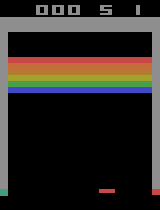

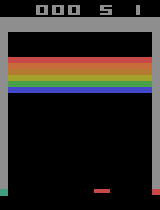

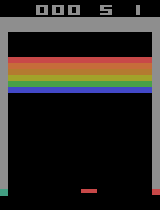

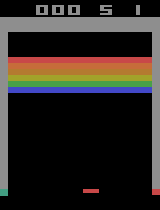

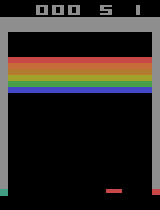

...

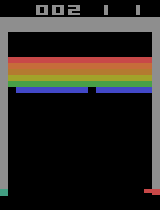

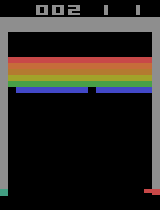

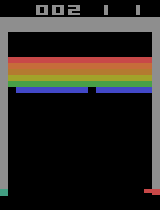

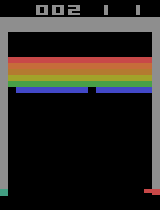

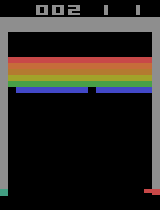

End of Episode 300: Total Reward: 2.0
Episode 300, Reward: 2.0, Epsilon: 0.2211807388415433
End of Episode 301: Total Reward: 3.0
End of Episode 302: Total Reward: 2.0
End of Episode 303: Total Reward: 4.0
End of Episode 304: Total Reward: 3.0
End of Episode 305: Total Reward: 4.0
End of Episode 306: Total Reward: 1.0
End of Episode 307: Total Reward: 3.0
End of Episode 308: Total Reward: 3.0
End of Episode 309: Total Reward: 0.0
End of Episode 310: Total Reward: 5.0
End of Episode 311: Total Reward: 2.0
End of Episode 312: Total Reward: 2.0
End of Episode 313: Total Reward: 1.0
End of Episode 314: Total Reward: 1.0
End of Episode 315: Total Reward: 2.0
End of Episode 316: Total Reward: 2.0
End of Episode 317: Total Reward: 4.0
End of Episode 318: Total Reward: 0.0
End of Episode 319: Total Reward: 1.0
End of Episode 320: Total Reward: 5.0
End of Episode 321: Total Reward: 2.0
End of Episode 322: Total Reward: 3.0
End of Episode 323: Total Reward: 0.0
End of Episode 324: Total Reward: 

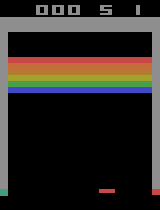

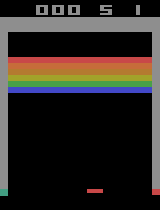

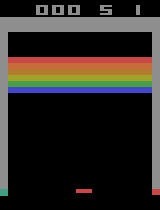

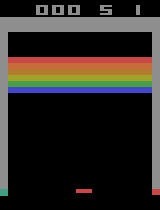

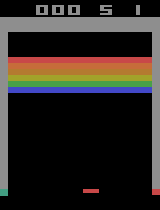

...

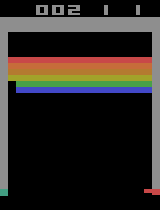

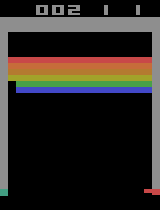

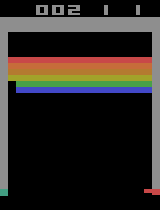

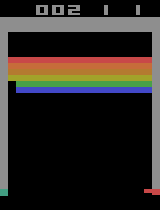

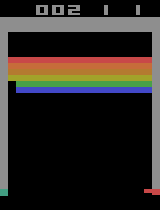

End of Episode 400: Total Reward: 2.0
Episode 400, Reward: 2.0, Epsilon: 0.13398475271138335
End of Episode 401: Total Reward: 6.0
End of Episode 402: Total Reward: 1.0
End of Episode 403: Total Reward: 1.0
End of Episode 404: Total Reward: 3.0
End of Episode 405: Total Reward: 0.0
End of Episode 406: Total Reward: 1.0
End of Episode 407: Total Reward: 3.0
End of Episode 408: Total Reward: 2.0
End of Episode 409: Total Reward: 7.0
End of Episode 410: Total Reward: 1.0
End of Episode 411: Total Reward: 0.0
End of Episode 412: Total Reward: 4.0
End of Episode 413: Total Reward: 2.0
End of Episode 414: Total Reward: 2.0
End of Episode 415: Total Reward: 3.0
End of Episode 416: Total Reward: 2.0
End of Episode 417: Total Reward: 3.0
End of Episode 418: Total Reward: 0.0
End of Episode 419: Total Reward: 0.0
End of Episode 420: Total Reward: 3.0
End of Episode 421: Total Reward: 2.0
End of Episode 422: Total Reward: 4.0
End of Episode 423: Total Reward: 5.0
End of Episode 424: Total Reward:

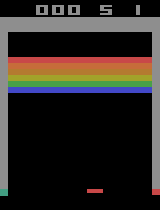

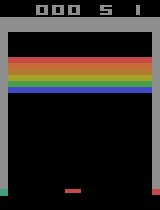

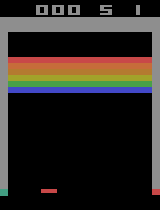

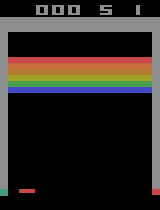

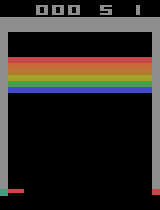

...

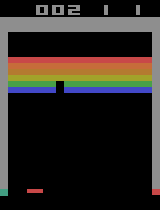

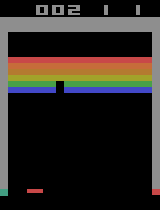

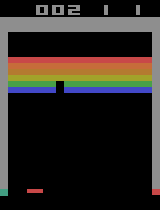

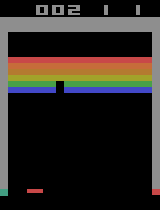

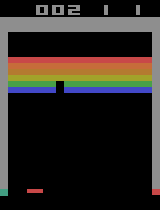

End of Episode 500: Total Reward: 2.0
Episode 500, Reward: 2.0, Epsilon: 0.0811640021330769
End of Episode 501: Total Reward: 2.0
End of Episode 502: Total Reward: 2.0
End of Episode 503: Total Reward: 1.0
End of Episode 504: Total Reward: 3.0
End of Episode 505: Total Reward: 3.0
End of Episode 506: Total Reward: 1.0
End of Episode 507: Total Reward: 0.0
End of Episode 508: Total Reward: 3.0
End of Episode 509: Total Reward: 2.0
End of Episode 510: Total Reward: 1.0
End of Episode 511: Total Reward: 3.0
End of Episode 512: Total Reward: 3.0
End of Episode 513: Total Reward: 1.0
End of Episode 514: Total Reward: 3.0
End of Episode 515: Total Reward: 4.0
End of Episode 516: Total Reward: 4.0
End of Episode 517: Total Reward: 3.0
End of Episode 518: Total Reward: 2.0
End of Episode 519: Total Reward: 4.0
End of Episode 520: Total Reward: 2.0
End of Episode 521: Total Reward: 1.0
End of Episode 522: Total Reward: 3.0
End of Episode 523: Total Reward: 5.0
End of Episode 524: Total Reward: 

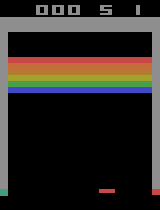

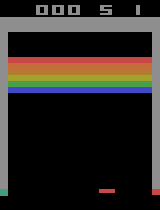

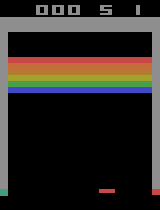

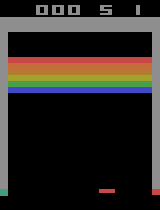

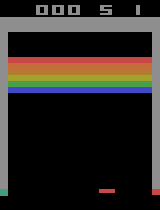

...

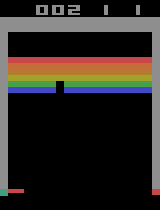

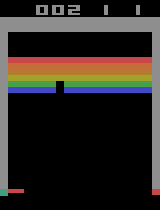

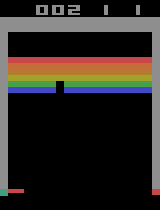

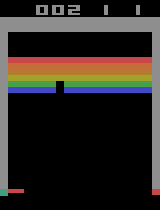

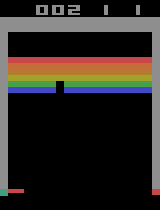

End of Episode 600: Total Reward: 2.0
Episode 600, Reward: 2.0, Epsilon: 0.04916675299948831
End of Episode 601: Total Reward: 2.0
End of Episode 602: Total Reward: 2.0
End of Episode 603: Total Reward: 0.0
End of Episode 604: Total Reward: 0.0
End of Episode 605: Total Reward: 1.0
End of Episode 606: Total Reward: 0.0
End of Episode 607: Total Reward: 3.0
End of Episode 608: Total Reward: 3.0
End of Episode 609: Total Reward: 1.0
End of Episode 610: Total Reward: 3.0
End of Episode 611: Total Reward: 0.0
End of Episode 612: Total Reward: 2.0
End of Episode 613: Total Reward: 3.0
End of Episode 614: Total Reward: 3.0
End of Episode 615: Total Reward: 1.0
End of Episode 616: Total Reward: 1.0
End of Episode 617: Total Reward: 0.0
End of Episode 618: Total Reward: 0.0
End of Episode 619: Total Reward: 1.0
End of Episode 620: Total Reward: 2.0
End of Episode 621: Total Reward: 0.0
End of Episode 622: Total Reward: 0.0
End of Episode 623: Total Reward: 4.0
End of Episode 624: Total Reward:

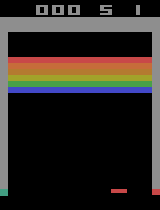

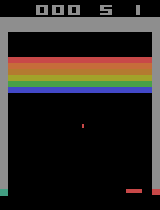

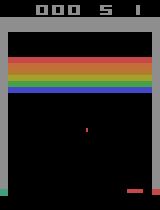

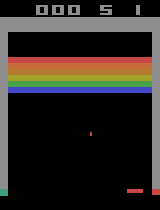

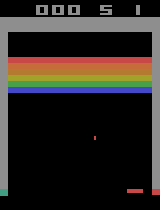

...

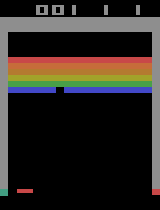

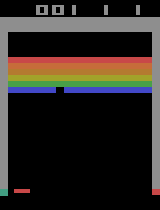

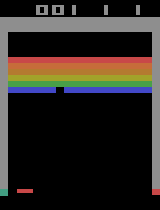

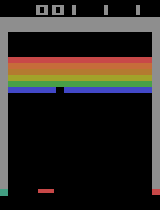

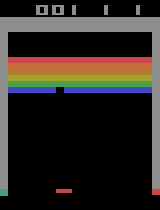

End of Episode 700: Total Reward: 1.0
Episode 700, Reward: 1.0, Epsilon: 0.029783765425331846
End of Episode 701: Total Reward: 3.0
End of Episode 702: Total Reward: 3.0
End of Episode 703: Total Reward: 0.0
End of Episode 704: Total Reward: 2.0
End of Episode 705: Total Reward: 2.0
End of Episode 706: Total Reward: 1.0
End of Episode 707: Total Reward: 0.0
End of Episode 708: Total Reward: 4.0
End of Episode 709: Total Reward: 3.0
End of Episode 710: Total Reward: 2.0
End of Episode 711: Total Reward: 1.0
End of Episode 712: Total Reward: 4.0
End of Episode 713: Total Reward: 2.0
End of Episode 714: Total Reward: 0.0
End of Episode 715: Total Reward: 1.0
End of Episode 716: Total Reward: 3.0
End of Episode 717: Total Reward: 3.0
End of Episode 718: Total Reward: 0.0
End of Episode 719: Total Reward: 3.0
End of Episode 720: Total Reward: 0.0
End of Episode 721: Total Reward: 3.0
End of Episode 722: Total Reward: 0.0
End of Episode 723: Total Reward: 2.0
End of Episode 724: Total Reward

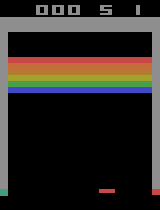

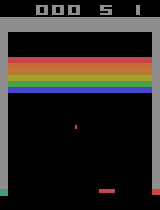

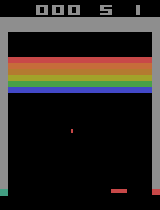

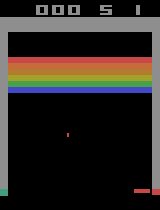

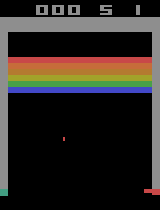

...

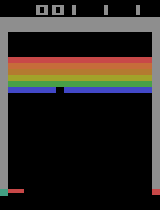

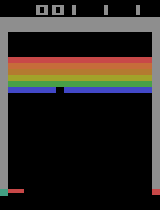

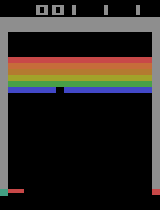

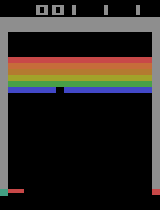

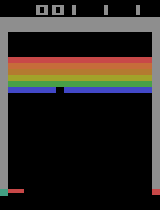

End of Episode 800: Total Reward: 1.0
Episode 800, Reward: 1.0, Epsilon: 0.018042124582040707
End of Episode 801: Total Reward: 7.0
End of Episode 802: Total Reward: 5.0
End of Episode 803: Total Reward: 2.0
End of Episode 804: Total Reward: 0.0
End of Episode 805: Total Reward: 4.0
End of Episode 806: Total Reward: 2.0
End of Episode 807: Total Reward: 6.0
End of Episode 808: Total Reward: 3.0
End of Episode 809: Total Reward: 3.0
End of Episode 810: Total Reward: 3.0
End of Episode 811: Total Reward: 2.0
End of Episode 812: Total Reward: 3.0
End of Episode 813: Total Reward: 3.0
End of Episode 814: Total Reward: 1.0
End of Episode 815: Total Reward: 1.0
End of Episode 816: Total Reward: 3.0
End of Episode 817: Total Reward: 3.0


In [ ]:
num_episodes = 1000
target_update_interval = 100
episode_rewards = []

for episode in range(num_episodes):
    state, _ = env.reset()
    done = False
    episode_reward = 0

    # Преобразование первого кадра и создание начального стека кадров
    state_gray = cv2.cvtColor(state, cv2.COLOR_RGB2GRAY)
    state_resized = cv2.resize(state_gray, (84, 84))
    state_stack = np.stack([state_resized] * agent.num_frames, axis=0)

    while not done:
        action = agent.act(state_stack, agent.epsilon)
        next_state, reward, done, _, _ = env.step(action)

        next_state_gray = cv2.cvtColor(next_state, cv2.COLOR_RGB2GRAY)
        next_state_resized = cv2.resize(next_state_gray, (84, 84))

        next_state_stack = np.append(state_stack[1:], np.expand_dims(next_state_resized, axis=0), axis=0)

        agent.push(state_stack, action, reward, next_state_stack, done)
        agent.update()

        state_stack = next_state_stack
        episode_reward += reward

        if episode % 100 == 0:
            frame = env.render()
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            cv2_imshow(frame_rgb)

    episode_rewards.append(episode_reward)
    print(f"End of Episode {episode}: Total Reward: {episode_reward}")

    if episode % target_update_interval == 0:
        agent.update_target_network()

    agent.decay_epsilon()

    if episode % 100 == 0:
        print(f"Episode {episode}, Reward: {episode_reward}, Epsilon: {agent.epsilon}")

In [ ]:
print("All Episodes:")
for episode in range(num_episodes):
    print(f"Episode {episode}: Total Reward: {episode_rewards[episode]}")

All Episodes:
Episode 0: Total Reward: 2.0
Episode 1: Total Reward: 1.0
Episode 2: Total Reward: 3.0
Episode 3: Total Reward: 2.0
Episode 4: Total Reward: 2.0
Episode 5: Total Reward: 3.0
Episode 6: Total Reward: 0.0
Episode 7: Total Reward: 0.0
Episode 8: Total Reward: 2.0
Episode 9: Total Reward: 1.0
Episode 10: Total Reward: 0.0
Episode 11: Total Reward: 2.0
Episode 12: Total Reward: 1.0
Episode 13: Total Reward: 1.0
Episode 14: Total Reward: 2.0
Episode 15: Total Reward: 0.0
Episode 16: Total Reward: 0.0
Episode 17: Total Reward: 1.0
Episode 18: Total Reward: 1.0
Episode 19: Total Reward: 0.0
Episode 20: Total Reward: 2.0
Episode 21: Total Reward: 0.0
Episode 22: Total Reward: 0.0
Episode 23: Total Reward: 2.0
Episode 24: Total Reward: 2.0
Episode 25: Total Reward: 2.0
Episode 26: Total Reward: 4.0
Episode 27: Total Reward: 0.0
Episode 28: Total Reward: 2.0
Episode 29: Total Reward: 3.0
Episode 30: Total Reward: 0.0
Episode 31: Total Reward: 2.0
Episode 32: Total Reward: 1.0
Episod

In [ ]:
# Сохранение весов после обучения
save_weights(agent)

# Загрузка модели для тестирования или продолжения обучения
load_weights(agent)

# Тестирование модели
num_episodes = 100  # Количество эпизодов для теста

for episode in range(num_episodes):
    state, _ = env.reset()
    state_gray = cv2.cvtColor(state, cv2.COLOR_RGB2GRAY)
    state_resized = cv2.resize(state_gray, (84, 84))
    state_stack = np.stack([state_resized] * 4, axis=0)

    done = False
    episode_reward = 0

    while not done:
        action = agent.act(state_stack, epsilon=0.0)  # Без случайных действий (для тестирования)
        next_state, reward, done, _, _ = env.step(action)

        state_stack = np.append(state_stack[1:], np.expand_dims(state_resized, axis=0), axis=0)
        episode_reward += reward

    print(f"End of Episode {episode + 1}: Total Reward: {episode_reward}")